# Feathering

Goals:

 * Describe and demonstrate feathering process
 * Show some of the free parameters that can be selected when feathering
 * Show various visualizations that can be used to assess goodness-of-merge
 * Demonstrate limitations of image combination

## What is feathering?

Fourier-space (UV-space) weighted averaging of two data sets.

The weight function is selected to match the Fourier transform of the single-dish telescope's beam.

# Feathering (combination) tests

This notebook presents a series of experiments in single-dish + interferometer combination on "realistic" data.

We're "observing" at 2mm, so a 12m dish has a FWHM=40" Gaussian beam and a 9m baseline has a sharp cutoff at 56"

In [63]:
# ipython notebook setup:
%matplotlib inline

In [64]:
import pylab as pl
pl.rcParams['image.interpolation'] = 'nearest'
pl.rcParams['image.origin'] = 'lower'
pl.rcParams['figure.figsize'] = (12,8)
pl.rcParams['image.cmap'] = 'viridis'
pl.rcParams['patch.edgecolor'] = 'none'
pl.rcParams['axes.prop_cycle'] = pl.cycler('color', ('#338ADD', '#9A44B6', '#A60628', '#467821', '#CF4457', '#188487', '#E24A33'))
pl.rcParams['font.size'] = 20

Requirements for this work: [``turbustat``](https://github.com/Astroua/TurbuStat/) generates our synthetic data and helps with power-spectral-density (PSD) plotting.  ``astropy.convolution`` provides access to convolution tools, and ``uvcombine`` is our python-only implementation of ``feather``.

https://turbustat.readthedocs.io/en/latest/

In [65]:
from turbustat.simulator.gen_field import make_extended
from turbustat.statistics import psds
from astropy import convolution, units as u
import numpy as np
from uvcombine.uvcombine import feather_kernel, fftmerge

We create a synthetic power-law power-spectrum image.  This sort of image is typical of a dust image of the Galactic plane, for example.

In [66]:
# create an input image with specified parameters
# (this can later be modified - it will be good to examine the effects of
# different power laws, different types of input...)
# We're assuming a scale of 1"/pixel for this example
imsize = 512
im = make_extended(imsize=imsize, powerlaw=1.5, randomseed=0)
# the real sky is positive, so we subtract the minimum to force the overall image positive
im = im - im.min()

### Input Image Visualization ###
This is the input image along with its histogram.

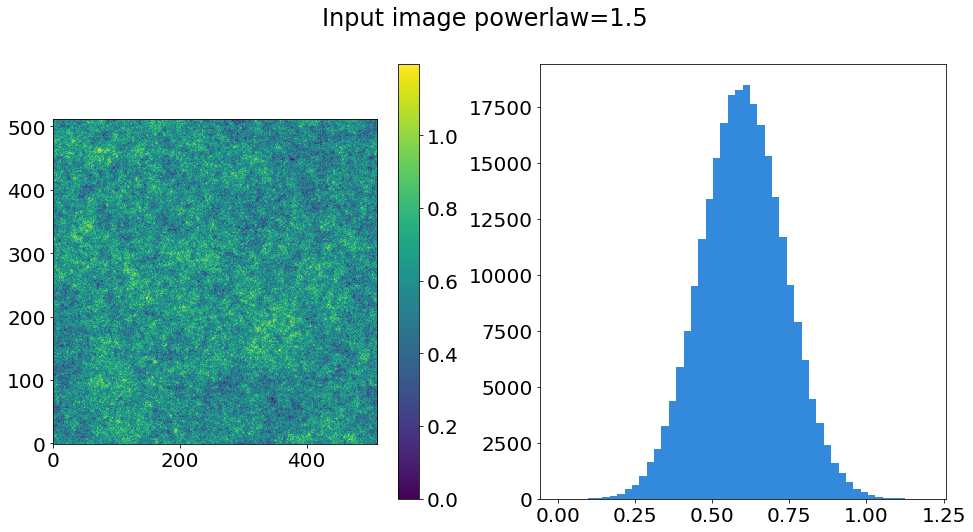

In [67]:
# for each step, we'll save a figure
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.subplot(1,2,2)
pl.hist(im.ravel(), bins=50)
pl.suptitle("Input image powerlaw=1.5")
pl.savefig("inputimage_pl1.5.png")

The power spectrum of the input image (set to be $\alpha=1.5$), verifying that the turbustat code works

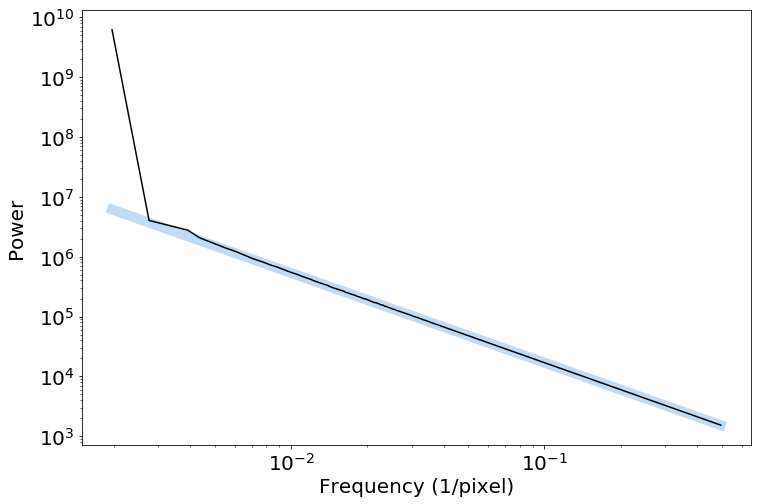

In [68]:
psd2 = np.fft.fftshift(np.abs(np.fft.fft2(im)**2))
pfreq, ppow = psds.pspec(psd2)
pl.loglog(pfreq, ppow[-1] * (pfreq/pfreq[-1])**-1.5, alpha=0.3, linewidth=10, zorder=-20)
pl.loglog(pfreq[np.isfinite(ppow)], ppow[np.isfinite(ppow)], color='k')
pl.ylabel("Power")
_=pl.xlabel("Frequency (1/pixel)")

Next, we create our simulated interferometer by creating a UV domain and selecting which pixels in that domain will be part of our telescope.  This process creates an ideal interferometer.

In [69]:
# set up the grid
ygrid, xgrid = np.indices(im.shape, dtype='float')
rr = ((xgrid-im.shape[1]/2)**2+(ygrid-im.shape[0]/2)**2)**0.5

In [70]:
# Create a UV sampling mask.
# This removes all large-angular scale (r<8) features *in UV space* and all
# small angular scales.
# In fourier space, r=0 corresponds to the DC component
# r=1 corresponds to the full map (one period over that map)
# r=256 is the smallest angular scale, which is 2 pixels
# We're assuming a pixel scale of 1" / pixel
# therefore 56" corresponds to 9m at 2mm (i.e., nearly the closest spacing possible for 7m)
# We cut off the "interferometer" at 2.5" resolution
largest_scale = 56.*u.arcsec
smallest_scale = 2.5*u.arcsec
pixscale = 1*u.arcsec
image_scale = im.shape[0]*pixscale # assume symmetric (default=256)
ring = (rr>=(image_scale/largest_scale)) & (rr<=(image_scale/smallest_scale))

### Synthetic Perfect Interferometer ###
The synthetic interferometer's UV coverage map (it's a perfect interferometer)

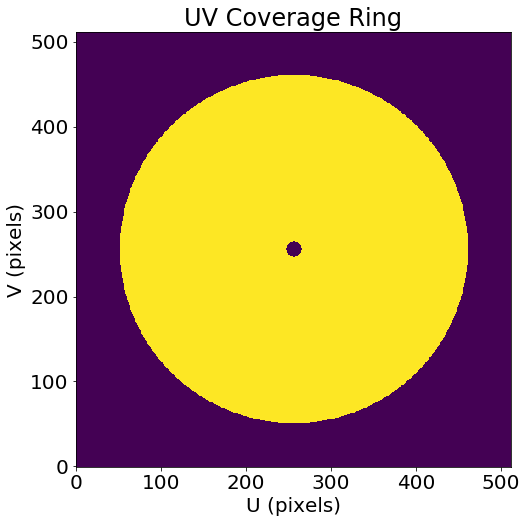

In [71]:
pl.clf()
pl.imshow(ring)
pl.title("UV Coverage Ring")
pl.xlabel("U (pixels)")
pl.ylabel("V (pixels)")
pl.savefig("uvcoverage_ring.png")

Next, we create the interferometric map by multiplying our interferometer mask by the fourier transform of the sky data

In [72]:
# create the interferometric map by removing both large and small angular
# scales in fourier space
imfft = np.fft.fft2(im)
imfft_interferometered = imfft * np.fft.fftshift(ring)
im_interferometered = np.fft.ifft2(imfft_interferometered)

The interferometric image does not preserve total flux, as expected.  Note that the mean of the histogram is shifted.

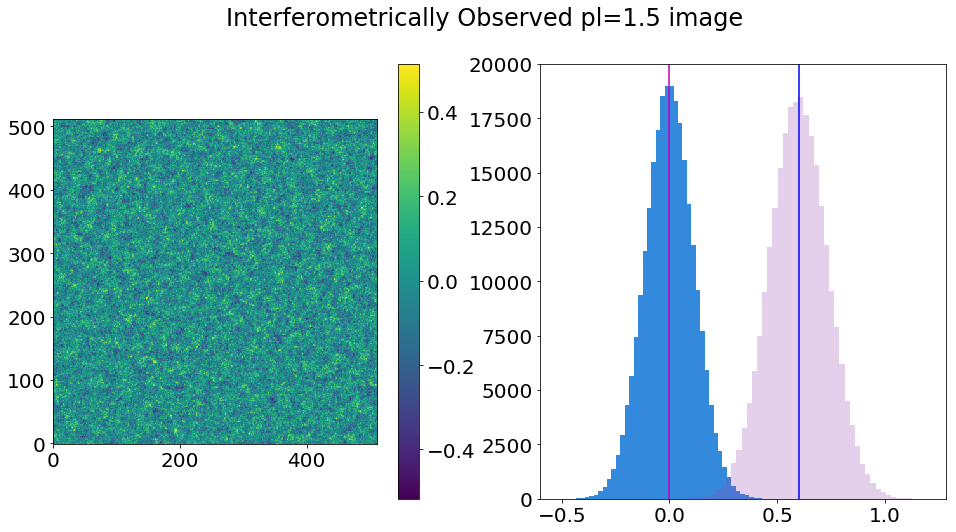

In [73]:
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(im_interferometered.real, cmap='viridis')
pl.colorbar()
pl.suptitle("Interferometrically Observed pl=1.5 image")
pl.subplot(1,2,2)
pl.hist(im_interferometered.real.ravel(), bins=50)
mean_in = im.mean()
mean_out = im_interferometered.real.mean()
pl.vlines([mean_in], 0, 25000, color='b')
pl.vlines([mean_out], 0, 25000, color='m')
pl.hist(im.ravel(), bins=50, alpha=0.25)
pl.ylim(0,20000)
pl.savefig("interf_image_pl1.5.png")

The residual of the original image minus the interferometrically observed image.  The large scales and noise are preserved.

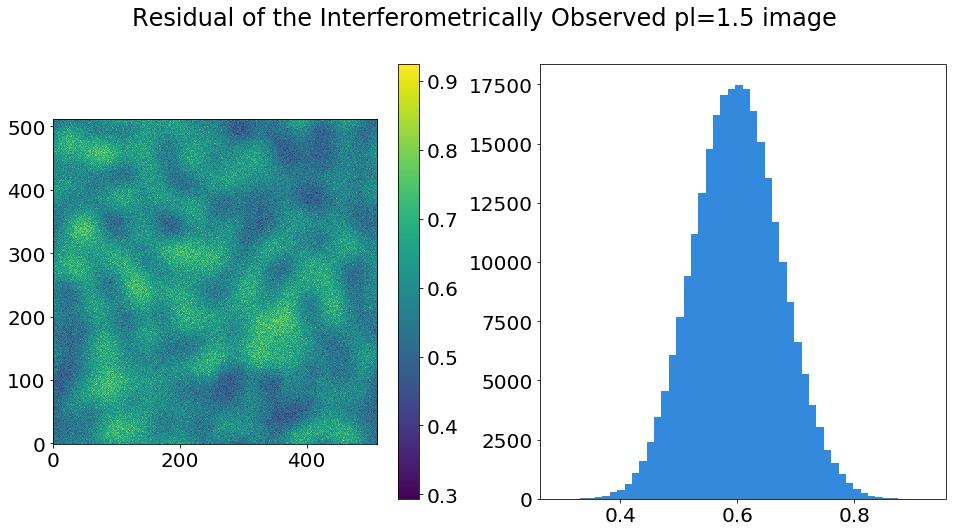

In [74]:
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(im-im_interferometered.real, cmap='viridis')
pl.colorbar()
pl.suptitle("Residual of the Interferometrically Observed pl=1.5 image")
pl.subplot(1,2,2)
pl.hist((im-im_interferometered.real).ravel(), bins=50)
pl.savefig("interf_image_pl1.5_residual.png")

### Synthetic Single Dish ###
The single dish map is just a convolution of the original data with a Gaussian beam.  It preserves flux but loses small scales.

In [75]:
# create the single-dish map by convolving the image with a FWHM=40" kernel
# (this interpretation is much easier than the sharp-edged stuff in fourier
# space because the kernel is created in real space)
lowresfwhm = 40*u.arcsec
singledish_kernel = convolution.Gaussian2DKernel(lowresfwhm/pixscale/2.35, x_size=im.shape[1], y_size=im.shape[0])
singledish_kernel_fft = np.fft.fft2(singledish_kernel)
singledish_im = convolution.convolve_fft(im,
                                         kernel=singledish_kernel,
                                         boundary='fill',
                                         fill_value=im.mean())

The single-dish image and its histogram

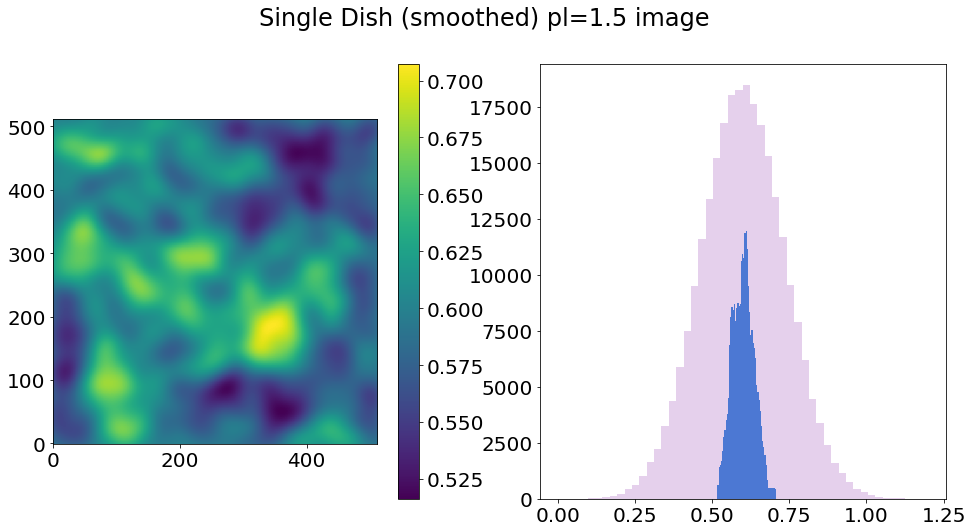

In [76]:
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(singledish_im, cmap='viridis')
pl.colorbar()
pl.subplot(1,2,2)
pl.hist(singledish_im.ravel(), bins=50)
pl.hist(im.ravel(), bins=50, alpha=0.25)
pl.suptitle("Single Dish (smoothed) pl=1.5 image")
pl.savefig("singledish_image_pl1.5.png")

### The single dish in Fourier space ###
We show the single dish beam in Fourier space with the interferometer coverage range overlaid

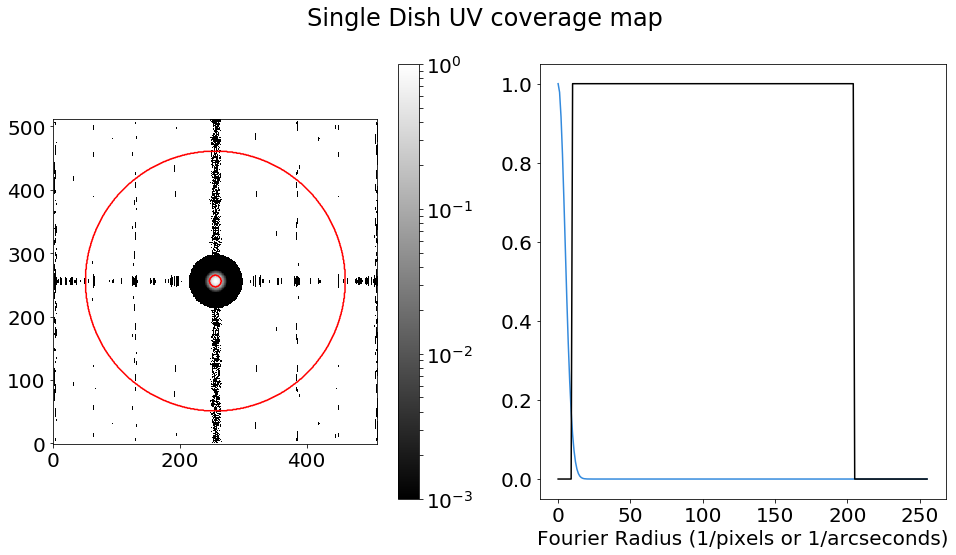

In [77]:
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(np.fft.fftshift(np.abs(singledish_kernel_fft)), cmap='gray',
          norm=pl.matplotlib.colors.LogNorm(),
          vmin=1e-3,
         )
pl.colorbar()
pl.contour(ring, levels=[0.5], colors=['r','r'])
pl.suptitle("Single Dish UV coverage map")
pl.subplot(1,2,2)
pl.plot(np.fft.fftshift(np.abs(singledish_kernel_fft))[int(im.shape[0]/2),int(im.shape[0]/2):])
pl.plot(ring[int(im.shape[0]/2),int(im.shape[0]/2):], color='k')
pl.xlabel("Fourier Radius (1/pixels or 1/arcseconds)")
pl.savefig("singledish_uvcoverage.png")

## Feathering ##
Feathering is the combination of the single-dish image with the interferometric image in the UV domain.

In the ``uvcombine`` package, this is handled by [``uvcombine.feather_simple``](https://github.com/radio-astro-tools/uvcombine/blob/master/uvcombine/uvcombine.py#L751).  However, we show the components of that function here.

For comparison, CASA's feather takes these inputs:
```
#  feather :: Combine two images using their Fourier transforms
imagename           =         ''        #  Name of output feathered image
highres             =         ''        #  Name of high resolution (interferometer) image
lowres              =         ''        #  Name of low resolution (single dish) image
sdfactor            =        1.0        #  Scale factor to apply to Single Dish image
effdishdiam         =       -1.0        #  New effective SingleDish diameter to use in m
lowpassfiltersd     =      False        #  Filter out the high spatial frequencies of the SD image
```

First, we define the FWHM of the low-resolution (single-dish) image, which defines the effective cutoff point between the interferometer and the single dish.  `lowresfwhm` is equivalent to `effdishdiam` from CASA, albeit in different units.

The kernels weight arrays for the single-dish and interferometer data.  They are the fourier transforms of the low-resolution beam and (1-that kernel), respectively.

In [78]:
# pixel scale can be interpreted as "arcseconds"
# then, fwhm=40 means a beam fwhm of 40"
pixscale = 1*u.arcsec
lowresfwhm = 40*u.arcsec
nax1,nax2 = im.shape
kfft, ikfft = feather_kernel(nax2, nax1, lowresfwhm, pixscale,)

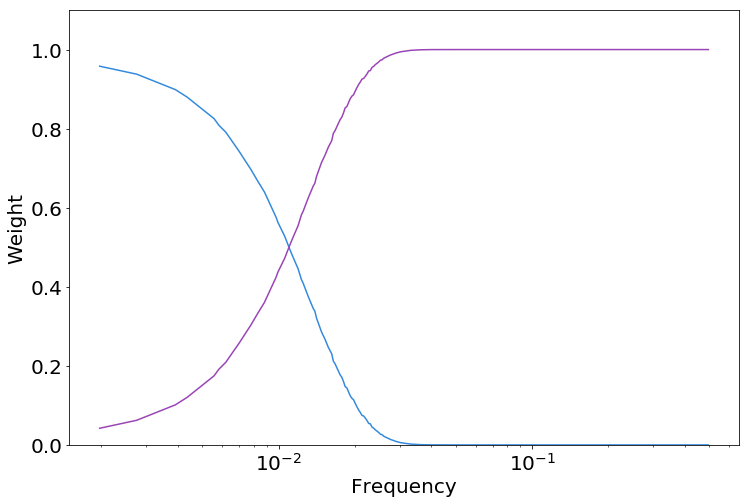

In [79]:
#plot the weight functions
x,y = psds.pspec(np.fft.fftshift(kfft.real))
x = x[y==y]
y = y[y==y]
pl.semilogx(x, y)

x,y = psds.pspec(np.fft.fftshift(ikfft.real))
x = x[y==y]
y = y[y==y]
pl.semilogx(x, y)

_=pl.ylim(0, 1.1)
_=pl.xlabel("Frequency")
_=pl.ylabel("Weight")

Then we specify a few parameters that are not all available in CASA.  CASA's `lowpassfiltersd` is equivalent to our `replace_hires`, and their `sdfactor` is our `lowresscalefactor`.  The other parameters, `highresscalefactor` and `deconvSD` are unavailable in CASA.

In [80]:
# Feather the interferometer and single dish data back together
# This uses the naive assumptions that CASA uses
# However, there are a few flags that can be played with.
# None of them do a whole lot, though there are good theoretical
# reasons to attempt them.
im_hi = im_interferometered.real
im_low = singledish_im
lowresscalefactor=1
replace_hires = False
highpassfilterSD = False
deconvSD = False
highresscalefactor=1
fftsum, combo = fftmerge(kfft, ikfft, im_hi*highresscalefactor,
                         im_low*lowresscalefactor,
                         replace_hires=replace_hires,
                         highpassfilterSD=highpassfilterSD,
                         deconvSD=deconvSD,
                        )

The feathered data set looks pretty good.

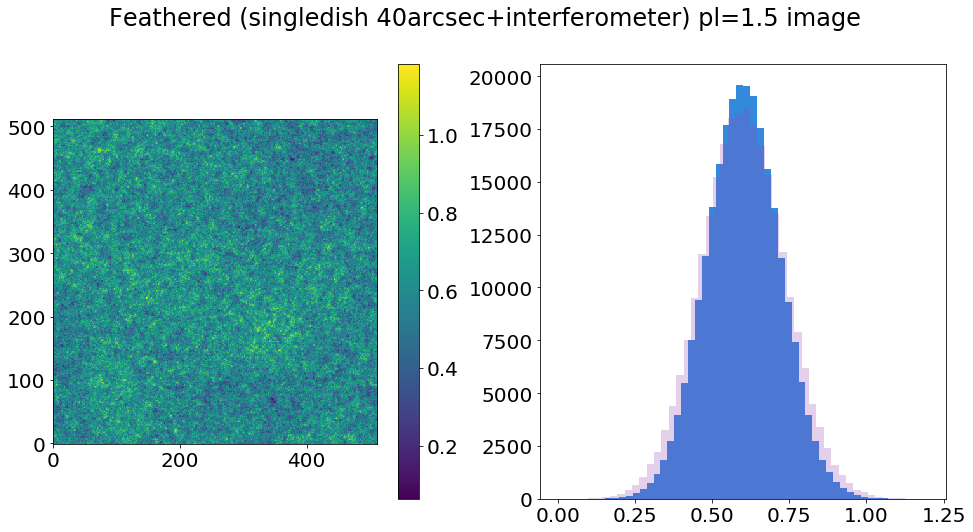

In [81]:
# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo.real, cmap='viridis')
pl.colorbar()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.hist(combo.real.ravel(), bins=50)
pl.hist(im.ravel(), bins=50, alpha=0.25)
pl.savefig("feathered_image_pl1.5.png")

This image looks pretty close to the original, but the peaks and valleys certainly are not recovered (the contrast is reduced compared to the original).

We then compare the feathered data to the input image.

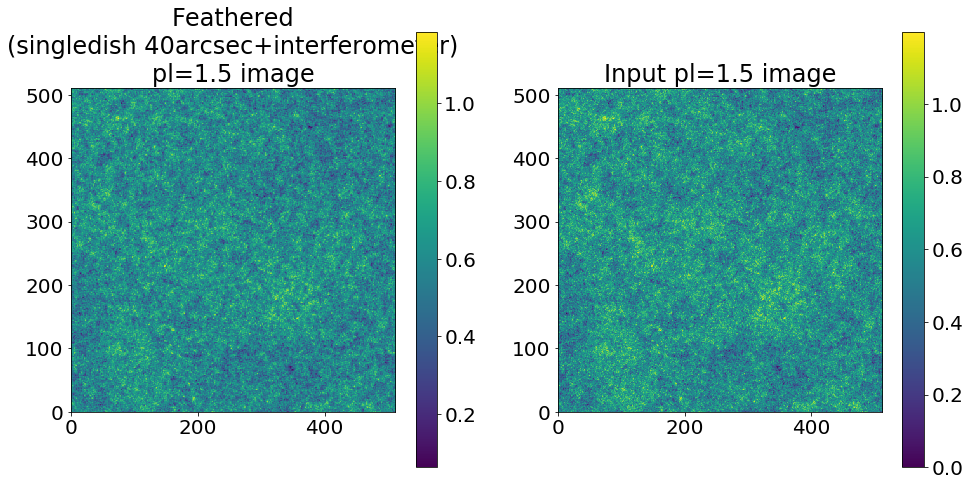

In [82]:
# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered\n(singledish 40arcsec+interferometer)\npl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
_=pl.title("Input pl=1.5 image")

The difference between the input image and the feathered image shows the remainder artifacts.

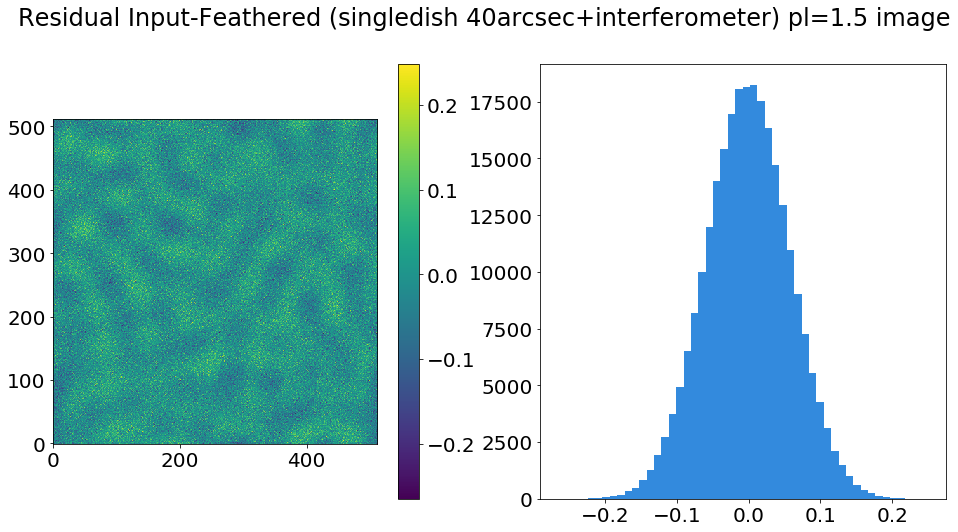

In [83]:
# Residuals (original minus feathered)
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(im-combo.real, cmap='viridis')
pl.colorbar()
pl.suptitle("Residual Input-Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.hist((im-combo.real).ravel(), bins=50)
pl.savefig("residual_feathered_image_pl1.5.png")

If we repeat the same experiment again, but with the shortest baseline at 12m instead of 9m, the results are noticeably worse:

In [84]:
largest_scale = 42. # (1.22 * 2*u.mm/(12*u.m)).to(u.arcsec, u.dimensionless_angles())
smallest_scale = 2.5
image_scale = im.shape[0] # assume symmetric (default=256)
ring = (rr>=(image_scale/largest_scale)) & (rr<=(image_scale/smallest_scale))

In [85]:
# create the interferometric map by removing both large and small angular
# scales in fourier space
imfft = np.fft.fft2(im)
imfft_interferometered = imfft * np.fft.fftshift(ring)
im_interferometered = np.fft.ifft2(imfft_interferometered)

In [86]:
im_hi = im_interferometered.real
lowresscalefactor=1
replace_hires = False
highpassfilterSD = False
deconvSD = False
highresscalefactor=1
fftsum, combo = fftmerge(kfft, ikfft, im_hi*highresscalefactor,
                         im_low*lowresscalefactor,
                         replace_hires=replace_hires,
                         highpassfilterSD=highpassfilterSD,
                         deconvSD=deconvSD,
                        )

The feathered image with 12m shortest baselines instead of 9m

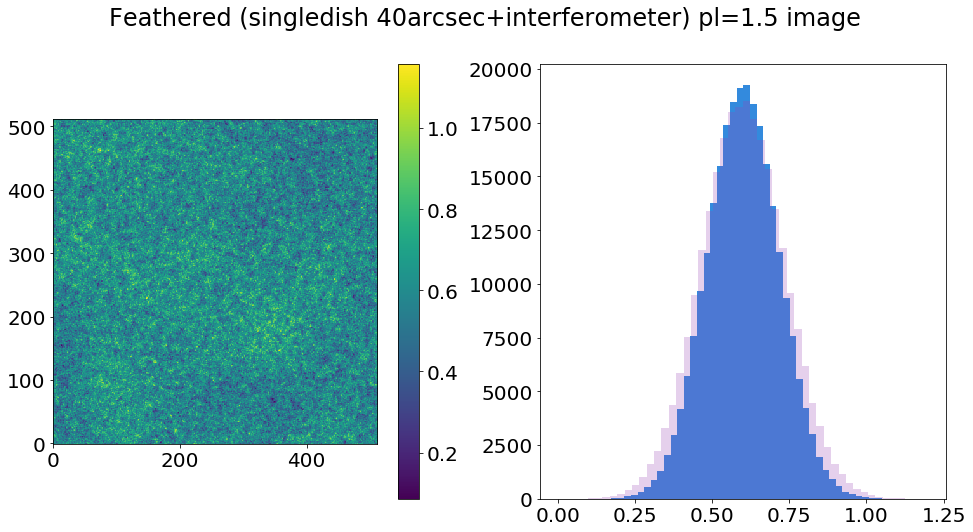

In [87]:
# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo.real, cmap='viridis')
pl.colorbar()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.hist(combo.real.ravel(), bins=50)
pl.hist(im.ravel(), bins=50, alpha=0.25)
pl.savefig("feathered_image_pl1.5_12mshort.png")

The side-by-side images comparison again

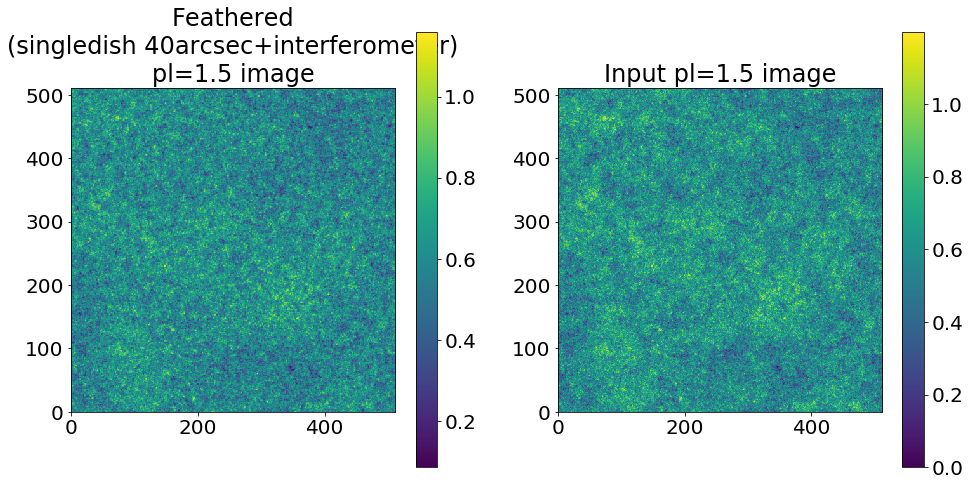

In [88]:
# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered\n(singledish 40arcsec+interferometer)\npl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
_=pl.title("Input pl=1.5 image")

The difference image (original - feathered)

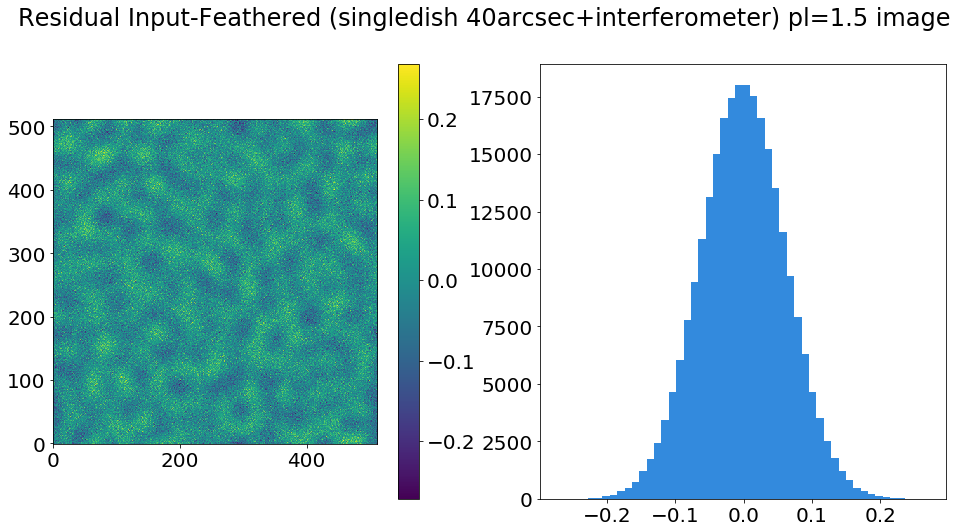

In [89]:
# Residuals (original minus feathered)
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(im-combo.real, cmap='viridis')
pl.colorbar()
pl.suptitle("Residual Input-Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.hist((im-combo.real).ravel(), bins=50)
pl.savefig("residual_feathered_image_pl1.5.png")

It is more helpful to look at the difference in power spectra

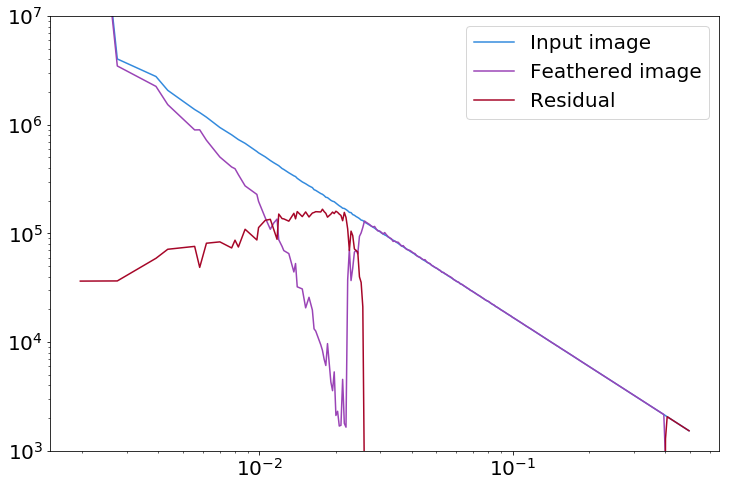

In [90]:
x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Input image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(combo.real)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Feathered image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im-combo.real)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Residual")

pl.legend(loc='best')
_=pl.ylim(1e3, 1e7)

The components that go in to the feather can help clarify the picture

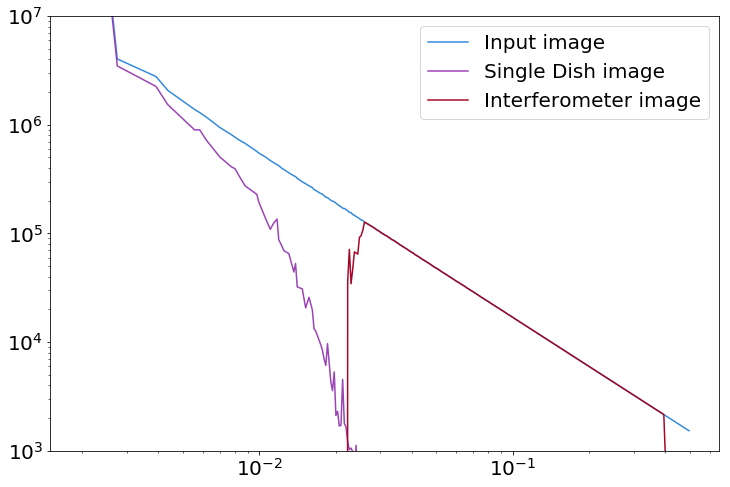

In [91]:
x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Input image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im_low)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Single Dish image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im_hi)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Interferometer image")

pl.legend(loc='best')
_=pl.ylim(1e3, 1e7)

Different combinations of parameters can yield very different results.

We have 8 parameter combinations: 
 
 * Replace singledish-interferometer overlap w/interferometer, or average them
 * Filter out the small angular scales from the single dish or don't
 * Deconvolve the single dish (direct deconvolution) or don't

The next slides are a walkthrough of parameter exploratio with different effective dish sizes.

First, we have a 12m dish with a shortest baseline length of 12m.

<img src=parameter_comparison_images_12mLAS_40asSD.png style="height: 600px">

<img src=parameter_comparison_residuals_12mLAS_40asSD.png style="height: 600px">

Residuals are in blue.

<img src=parameter_comparison_powerspectra_12mLAS_40asSD.png style="height: 600px">

A short-spacing limit of 12m for the interferometer and dish size of 12m is a bad case scenario, but not the worst.  ALMA's shortest baselines are 14.6m (main array) and 8.7m (7m array).  A realistic case for ALMA is then a 9m shortest baseline and a 12m effective single dish.

<img src=parameter_comparison_images_9mLAS_40asSD.png style="height: 600px">

<img src=parameter_comparison_residuals_9mLAS_40asSD.png style="height: 600px">

Residuals are in blue.

<img src=parameter_comparison_powerspectra_9mLAS_40asSD.png style="height: 600px">

This realistic case is still bad.  The "best case", in which we have good UV overlap (e.g., a 24m dish instead of a 12m), actually can get good theoretical recovery

<img src=parameter_comparison_images_9mLAS_20asSD.png style="height: 600px">

<img src=parameter_comparison_residuals_9mLAS_20asSD.png style="height: 600px">

Residuals are in blue.

<img src=parameter_comparison_powerspectra_9mLAS_20asSD.png style="height: 600px">

CASA's default parameters are fine, but for best performance, the single-dish image should be deconvolved.

These feather experiments represent the absolute best-case scenario.  They should be used as references for comparison with any other combination technique.

## Non-ideal cases

Besides simple UV coverage problems (which are expensive to fix and usually out of our control), there are other issues:

 * Relative calibration
 * Relative sensitivity

Relative calibration is an issue if the data simply aren't calibrated perfectly (systematic uncertainties are usually 5-15%) or if the single-dish data come from a different frequency range (e.g., using wide-band bolometer data to fill in the continuum zero-spacing).

We can simulate calibration error using the `highresscalefactor` and `lowresscalefactor` parameters, which are included to correct for these errors

In [102]:
lowresscalefactor = 1.50
highresscalefactor = 1.0
fftsum, combo = fftmerge(kfft, ikfft, im_hi*highresscalefactor,
                         im_low*lowresscalefactor,
                         replace_hires=replace_hires,
                         highpassfilterSD=highpassfilterSD,
                         deconvSD=deconvSD,
                        )

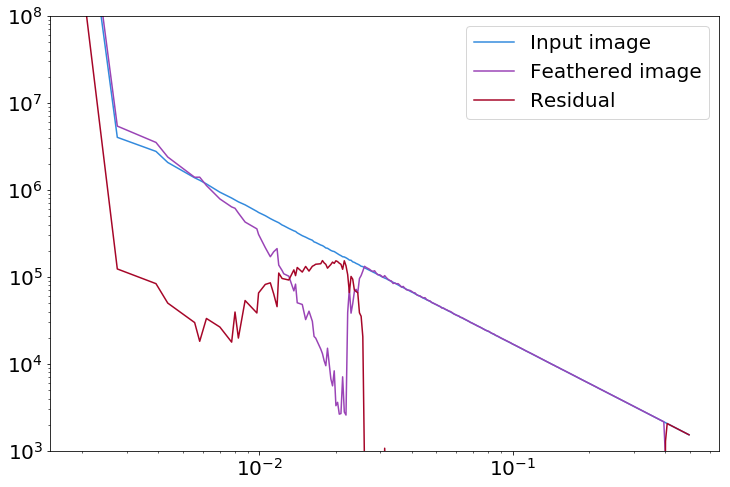

In [103]:
x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Input image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(combo.real)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Feathered image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im-combo.real)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Residual")

pl.legend(loc='best')
_=pl.ylim(1e3, 1e8)

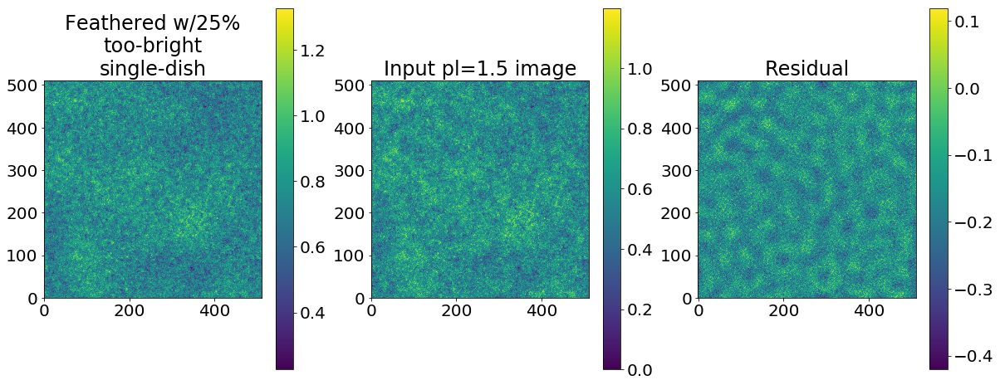

In [104]:
# Feathered dataset
pl.figure(1, figsize=(20,8)).clf()
pl.subplot(1,3,1)
pl.imshow(combo.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered w/50%\ntoo-bright\nsingle-dish")
pl.subplot(1,3,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
_=pl.title("Input pl=1.5 image")
pl.subplot(1,3,3)
pl.imshow(im-combo.real, cmap='viridis')
pl.colorbar()
_=pl.title("Residual")

In [105]:
lowresscalefactor = 1.0
highresscalefactor = 1.50
fftsum, combo = fftmerge(kfft, ikfft, im_hi*highresscalefactor,
                         im_low*lowresscalefactor,
                         replace_hires=replace_hires,
                         highpassfilterSD=highpassfilterSD,
                         deconvSD=deconvSD,
                        )

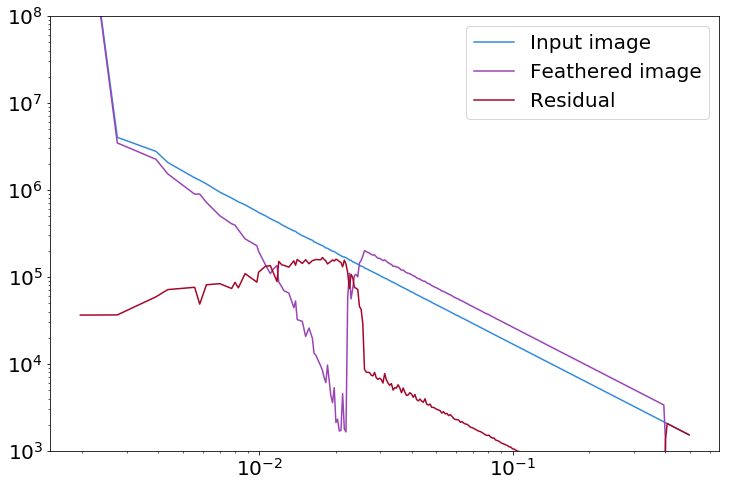

In [106]:
x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Input image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(combo.real)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Feathered image")

x,y = psds.pspec(np.fft.fftshift(np.abs(np.fft.fft2(im-combo.real)**2)))
x = x[y==y]
y = y[y==y]
pl.loglog(x, y, label="Residual")

pl.legend(loc='best')
_=pl.ylim(1e3, 1e8)

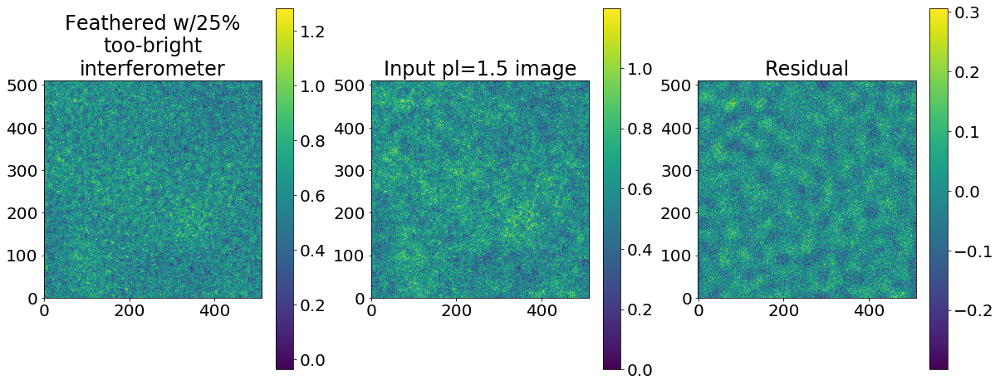

In [107]:
# Feathered dataset
pl.figure(1, figsize=(20,8)).clf()
pl.subplot(1,3,1)
pl.imshow(combo.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered w/25%\ntoo-bright\ninterferometer")
pl.subplot(1,3,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
_=pl.title("Input pl=1.5 image")
pl.subplot(1,3,3)
pl.imshow(im-combo.real, cmap='viridis')
pl.colorbar()
_=pl.title("Residual")

## Can we have an immerge-like capability in uvcombine? ##

We made the `feather_compare` function to try to determine the relative scaling factor between the interferometer and single-dish images.  In this section, we'll show that for theoretically perfect data, the approach works.

Because of the design of `feather_compare`, we need to assign FITS headers to our datasets.

In [30]:
from astropy.io import fits

In [31]:
from uvcombine.uvcombine import feather_compare
from astropy import units as u

In [32]:
print("Scales to compare: {0}-{1}".format(u.Quantity(lowresfwhm, u.arcsec), u.Quantity(largest_scale, u.arcsec)))

Scales to compare: 40.0 arcsec-42.0 arcsec


For the hypothetical interferometer we used most recently, there is effectively no overlap.  This is worthless and should NOT be used with this method!  Instead, we can create a new "interferometric" image with some overlap, say LAS=80.

In [33]:
# See above
largest_scale = 80.
smallest_scale = 2.5
image_scale = im.shape[0] # assume symmetric (default=256)
ring = (rr>=(image_scale/largest_scale)) & (rr<=(image_scale/smallest_scale))

imfft = np.fft.fft2(im)
imfft_interferometered = imfft * np.fft.fftshift(ring)
im_interferometered = np.fft.ifft2(imfft_interferometered)

In [34]:
print("Scales to compare: {0}-{1}".format(lowresfwhm*u.arcsec, largest_scale*u.arcsec))

Scales to compare: 40.0 arcsec2-80.0 arcsec


In [35]:
header = fits.Header({'CRVAL1':0.0, 'CRVAL2':0.0, 'CDELT1':1./3600., 'CDELT2':1./3600., 'CRPIX1':1.0, 'CRPIX2':1.0,
                      'CTYPE1':'GLON-CAR', 'CTYPE2':'GLAT-CAR'})
sd_hdu = fits.PrimaryHDU(data=singledish_im, header=header)
intf_hdu = fits.PrimaryHDU(data=im_interferometered.real, header=header)

We'll exhibit a few parameters.  

First, `beam_divide_lores` is a fourier-space deconvolution to try to remove the effect of the single-dish beam in foureir space.  We'll start by leaving this *off*.

Scales to compare: 40.0 arcsec-80.0 arcsec


/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


Reported statistics of the ratio of the high-res to low-res data: {'median': 4.521289208838373, 'mean': 5.369534712592613, 'std': 3.769051286542306, 'mean_sc': 4.775872211903677, 'median_sc': 4.3579038450001875, 'std_sc': 2.4488766777981326}


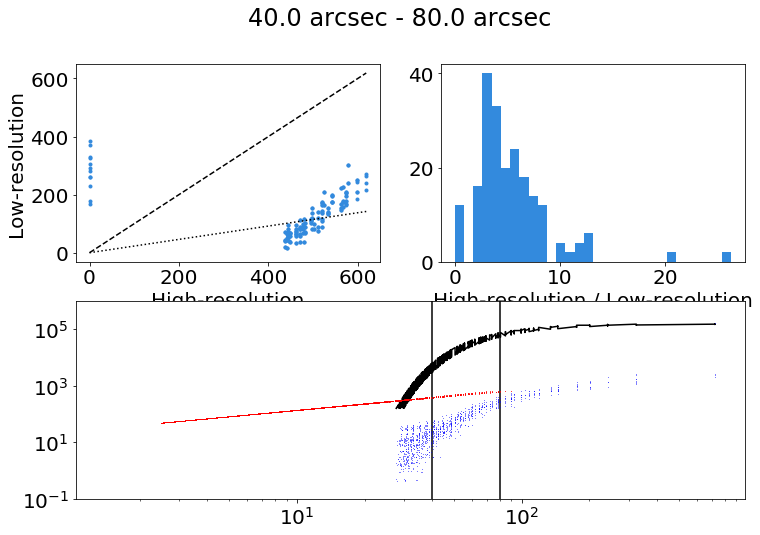

In [36]:
pl.figure(figsize=(12,8))
print("Scales to compare: {0}-{1}".format(lowresfwhm, largest_scale*u.arcsec))
stats = feather_compare(intf_hdu,
                        sd_hdu,
                        SAS=u.Quantity(lowresfwhm, u.arcsec),
                        LAS=u.Quantity(largest_scale, u.arcsec),
                        lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                        beam_divide_lores=False,
                       )
# fix the last plot a little
pl.gca().set_ylim(1e-1, 1e6)
print("Reported statistics of the ratio of the high-res to low-res data:", stats)

You can see the result, the high-res is over-compsenated by a factor of 3-6 or so.  The black line in the lower panel shows the effect of the beam in fourier space: it suppresses the intensity.

We can also see that this is a frustratingly noisy process.

Scales to compare: 40.0 arcsec2-80.0 arcsec


/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):
/Users/adam/repos/uvcombine/uvcombine/uvcombine.py:1414: RuntimeWarning: divide by zero encountered in true_divide
  fft_lo_deconvolved = fft_lo / kfft
/Users/adam/repos/uvcombine/uvcombine/uvcombine.py:1414: RuntimeWarning: invalid value encountered in true_divide
  fft_lo_deconvolved = fft_lo / kfft


Reported statistics of the ratio of the high-res to low-res data: {'median': 0.9247586125935459, 'mean': 0.9658601414587163, 'std': 0.41607198108742754, 'mean_sc': 0.9115491765422373, 'median_sc': 0.9234334836068325, 'std_sc': 0.3130667197571218}


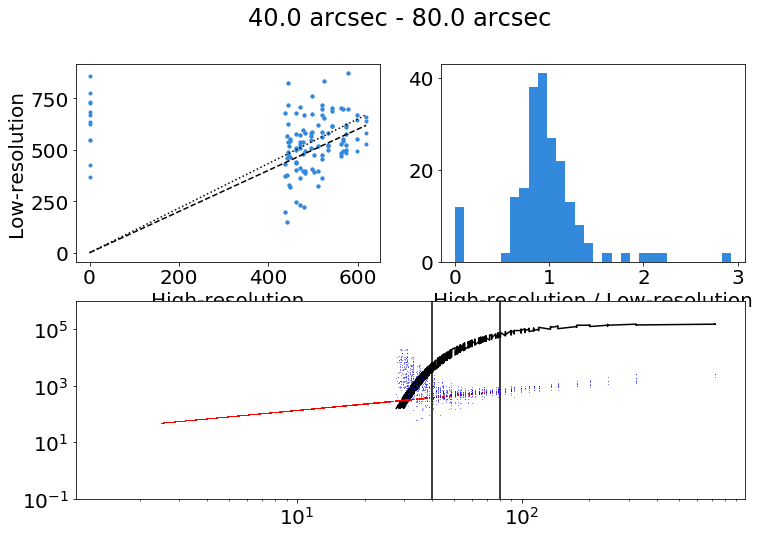

In [37]:
print("Scales to compare: {0}-{1}".format(lowresfwhm*u.arcsec, largest_scale*u.arcsec))
stats = feather_compare(intf_hdu,
                        sd_hdu,
                        SAS=u.Quantity(lowresfwhm, u.arcsec),
                        LAS=u.Quantity(largest_scale, u.arcsec),
                        lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                        beam_divide_lores=True,
                       )
# fix the last plot a little
pl.gca().set_ylim(1e-1, 1e6)
print("Reported statistics of the ratio of the high-res to low-res data:", stats)

Now the match is better, but still unfortunately pretty awful because of the noise.  The histogram shows us why: there are $\lesssim100$ points being compared between the two data sets.

We can also see what the 'real' image is supposed to look like in this space as compared with the single-dish and interferometer image:

(0.001, 100000.0)

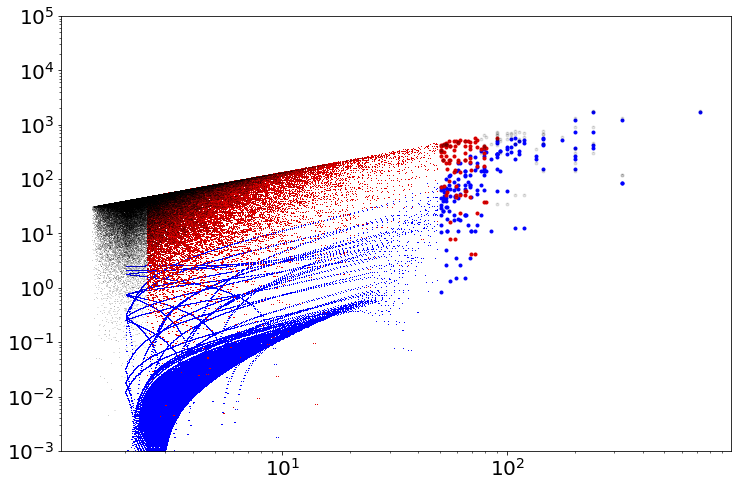

In [38]:
inp_fft = np.fft.fftshift(np.fft.fft2(im))
sd_fft = np.fft.fftshift(np.fft.fft2(singledish_im.real))
intf_fft = np.fft.fftshift(np.fft.fft2(im_interferometered.real))
nax2,nax1 = im.shape
yy,xx = np.indices([nax2, nax1])
rr = ((xx-(nax1-1)/2.)**2 + (yy-(nax2-1)/2.)**2)**0.5
angscales = nax1/rr * u.Quantity(pixscale, u.arcsec)
largescales = angscales > 50*u.arcsec
pl.loglog(angscales.to(u.arcsec).value.flat, inp_fft.real.flat, 'k,', alpha=0.1, zorder=2)
pl.loglog(angscales.to(u.arcsec).value.flat, intf_fft.real.flat, 'r,', zorder=1)
pl.loglog(angscales.to(u.arcsec).value.flat, sd_fft.real.flat, 'b,', zorder=-1)

pl.loglog(angscales.to(u.arcsec).value[largescales], inp_fft.real[largescales].flat, 'k.', alpha=0.1, zorder=2)
pl.loglog(angscales.to(u.arcsec).value[largescales], intf_fft.real[largescales].flat, 'r.', zorder=1)
pl.loglog(angscales.to(u.arcsec).value[largescales], sd_fft.real[largescales].flat, 'b.', zorder=-1)

pl.ylim(1e-3, 1e5)

(red = interferometer, blue = single dish, black = "truth")

The above plot looks very messy, but there are a few points worth noting.:

 * the single dish data don't reach 100% flux recovery until a very large scale.  Convolution in this case is *barely* flux conserving.
 * the interferometric data are exactly correct, since they were acquired with an 'ideal' sharply-truncated interferometer

So, the next question: What happens to the resulting image if you get the scale factor wrong?

In [39]:
from uvcombine.uvcombine import feather_simple


In [40]:
combo_correct = feather_simple(intf_hdu,
                               sd_hdu,
                               highresscalefactor=1.0,
                               lowresscalefactor=1.0,
                               lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                               match_units=False,
                              )                        

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


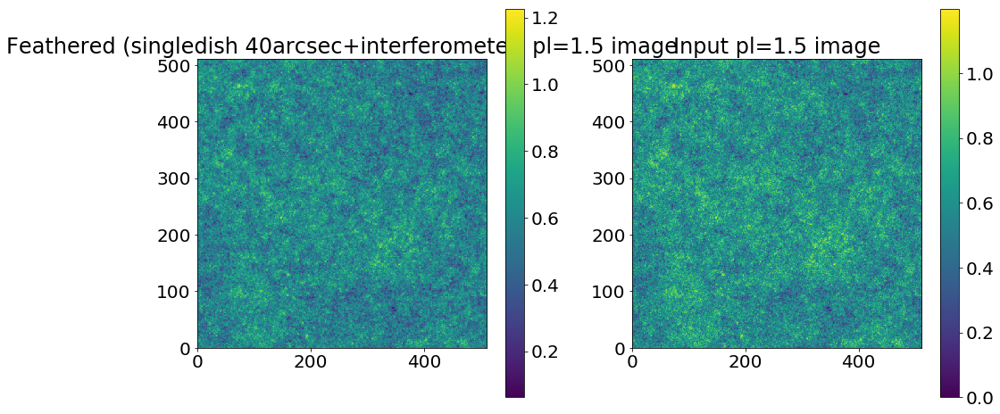

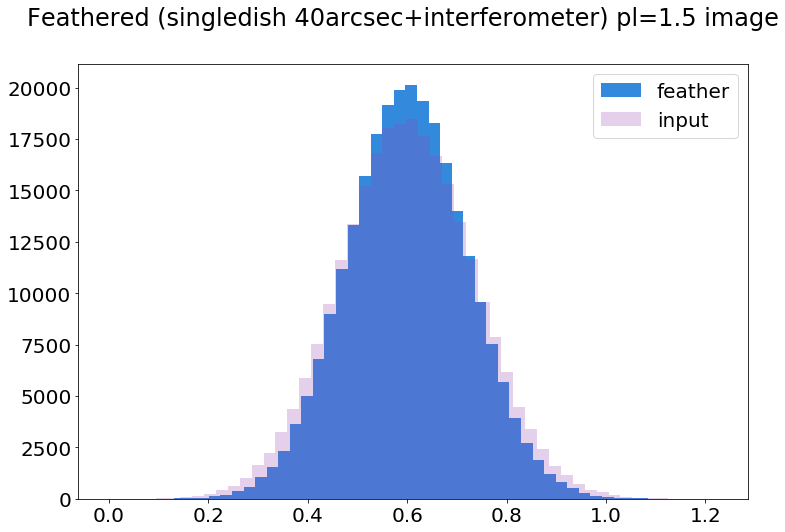

In [41]:
# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo_correct.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.title("Input pl=1.5 image")


# Feathered dataset
pl.figure(2).clf()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.hist(combo_correct.real.ravel(), bins=50, label='feather')
_ = pl.hist(im.ravel(), bins=50, alpha=0.25, label='input')
leg = pl.legend(loc='best')

In the "perfect combination, everything exactly right" case, it looks fine.  The images match well and the systematics in the histogram are fairly minor.  We'll now go through a parameter exploration and show how badly things can go:

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


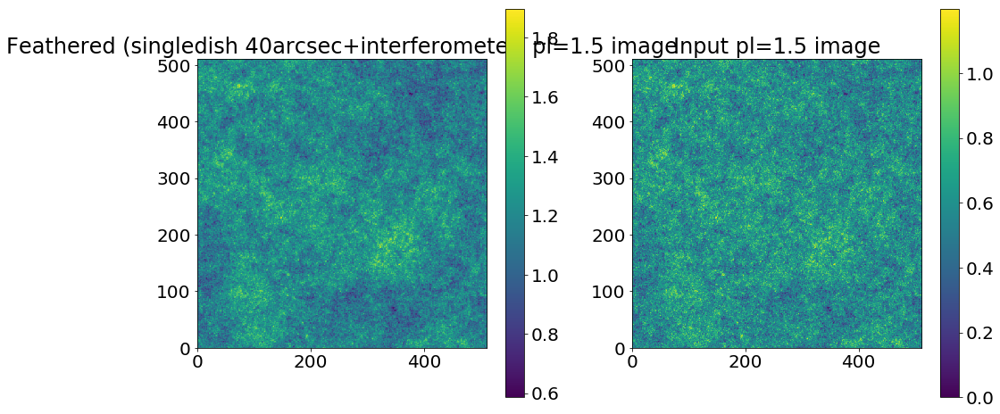

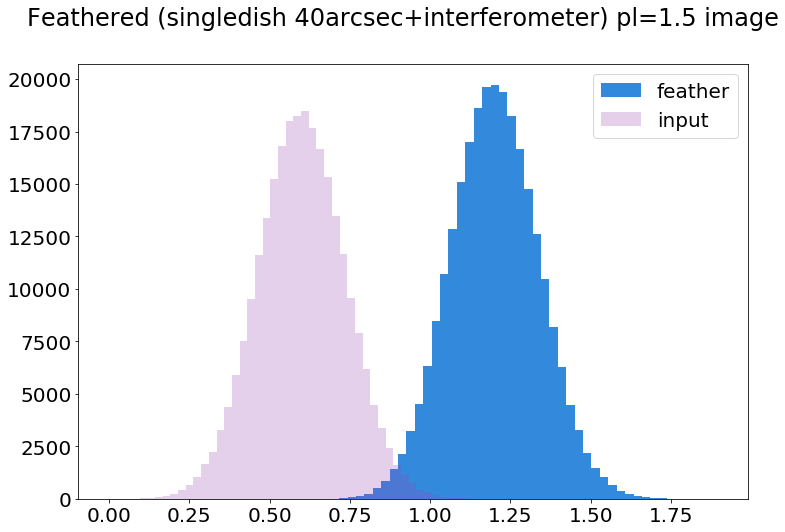

In [42]:
combo_lo_too_hi = feather_simple(intf_hdu,
                               sd_hdu,
                               highresscalefactor=1.0,
                               lowresscalefactor=2.0,
                               lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                               match_units=False,
                              )

# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo_lo_too_hi.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.title("Input pl=1.5 image")


# Feathered dataset
pl.figure(2).clf()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
_ = pl.hist(combo_lo_too_hi.real.ravel(), bins=50, label='feather')
_ = pl.hist(im.ravel(), bins=50, alpha=0.25, label='input')
leg = pl.legend(loc='best')

This is trivial: the flux is systematically shifted if you incorrectly scale the single-dish data.

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


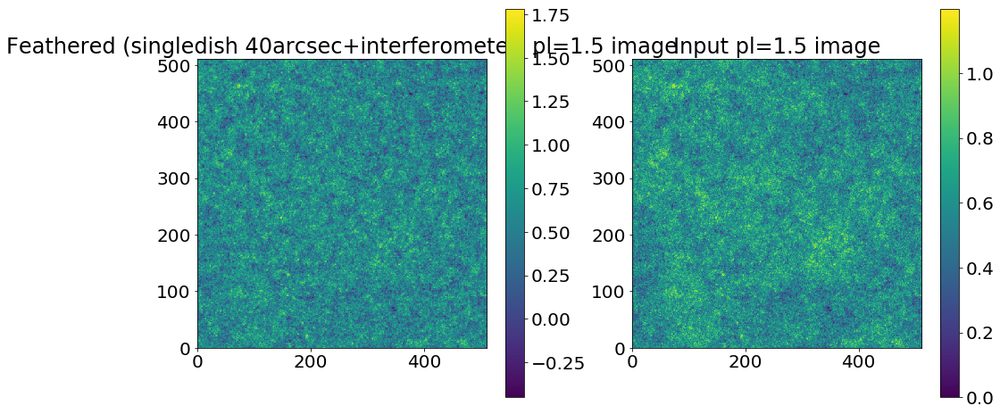

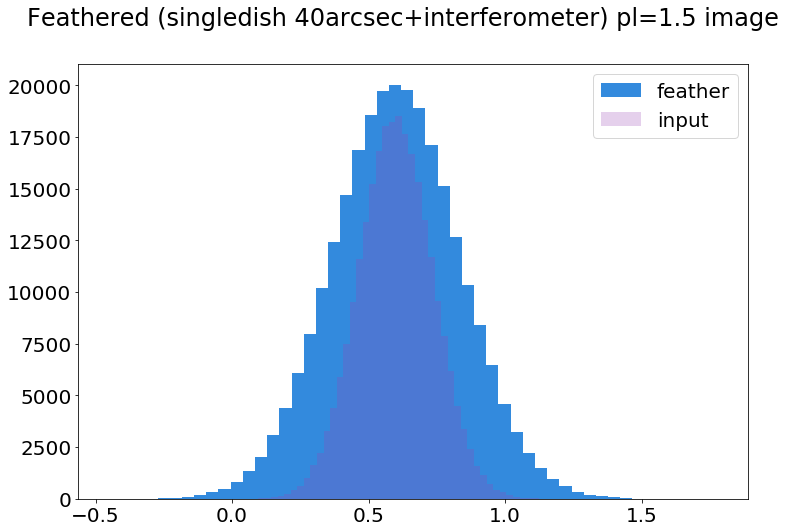

In [43]:
combo_hi_too_hi = feather_simple(intf_hdu,
                                 sd_hdu,
                                 highresscalefactor=2.0,
                                 lowresscalefactor=1.0,
                                 lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                                 match_units=False,
                              )

# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo_hi_too_hi.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.title("Input pl=1.5 image")


# Feathered dataset
pl.figure(2).clf()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
_ = pl.hist(combo_hi_too_hi.real.ravel(), bins=50, label='feather')
_ = pl.hist(im.ravel(), bins=50, alpha=0.25, label='input')
leg = pl.legend(loc='best')

If the high-resolution data is given too high a scale factor, the overall flux calibration stays approximately correct, but the high-resolution component of the image gets overemphasized, resulting in a spread of the flux distribution.

We can also check the importance and effectiveness of some of the other parameters.

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):
/Users/adam/repos/uvcombine/uvcombine/uvcombine.py:417: RuntimeWarning: divide by zero encountered in true_divide
  lo_conv = fft_lo / kfft
/Users/adam/repos/uvcombine/uvcombine/uvcombine.py:417: RuntimeWarning: invalid value encountered in true_divide
  lo_conv = fft_lo / kfft


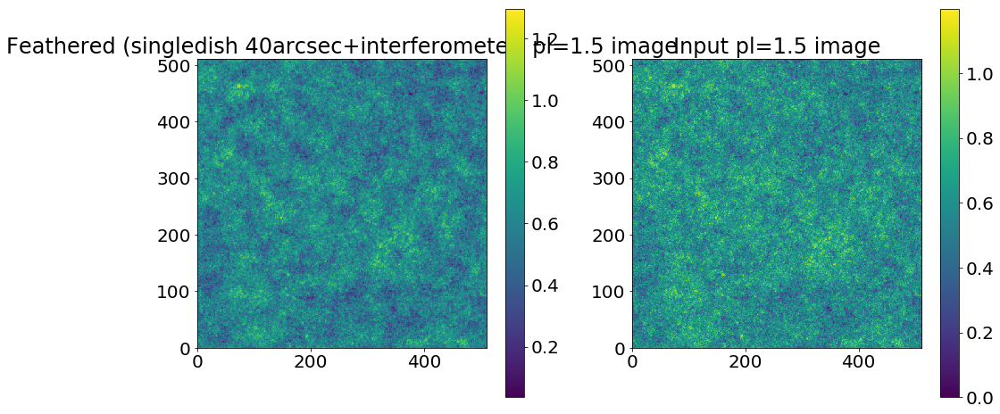

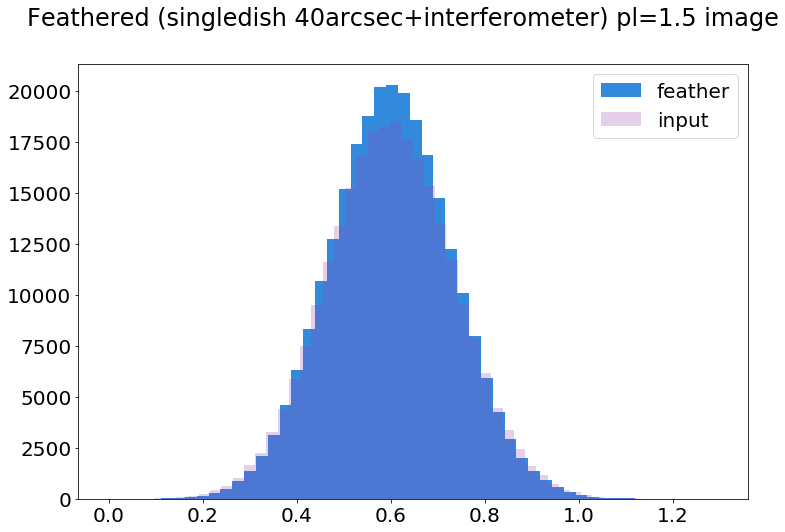

In [44]:
combo_deconv_sd = feather_simple(intf_hdu,
                                 sd_hdu,
                                 highresscalefactor=1.0,
                                 lowresscalefactor=1.0,
                                 lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                                 deconvSD=True,
                                 match_units=False,
                              )

# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo_deconv_sd.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.title("Input pl=1.5 image")


# Feathered dataset
pl.figure(2).clf()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
_ = pl.hist(combo_deconv_sd.real.ravel(), bins=50, label='feather')
_ = pl.hist(im.ravel(), bins=50, alpha=0.25, label='input')
leg = pl.legend(loc='best')

This works alright, but.... not great.

In principle, deconvolving the single-dish data in fourier space by the convolution kernel used to make the single-dish data should result in a better image.  That it does not probably means the fourier-space deconvolution is simply not reliable enough (it is severely affected by noise at the small end of the beam).

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


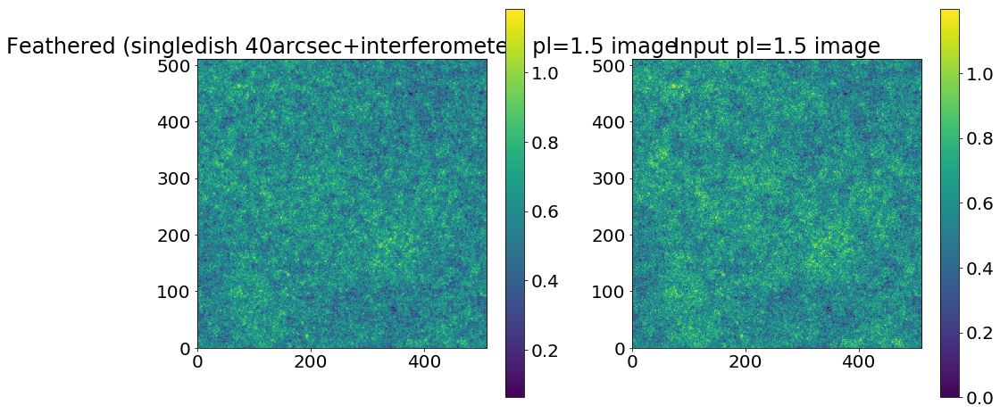

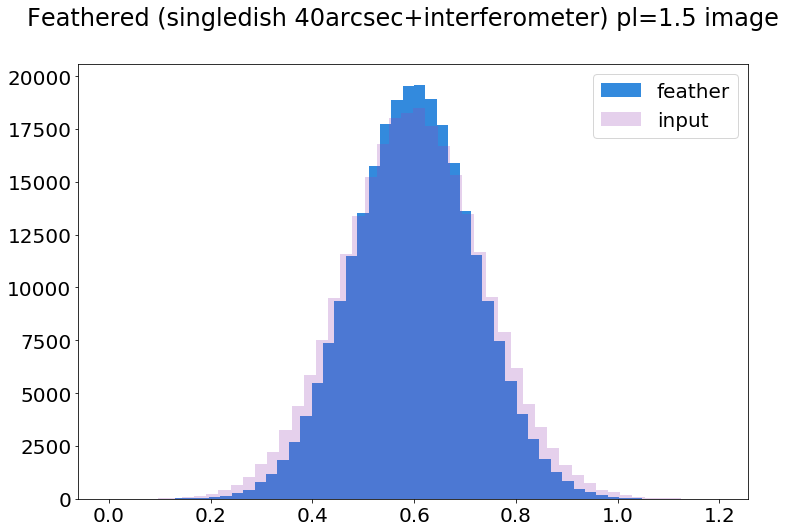

In [45]:
combo_replace_hires_08 = feather_simple(intf_hdu,
                                        sd_hdu,
                                        highresscalefactor=1.0,
                                        lowresscalefactor=1.0,
                                        lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                                        replace_hires=0.8,
                                        match_units=False,
                              )

# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo_replace_hires_08.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.title("Input pl=1.5 image")


# Feathered dataset
pl.figure(2).clf()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
_ = pl.hist(combo_replace_hires_08.real.ravel(), bins=50, label='feather')
_ = pl.hist(im.ravel(), bins=50, alpha=0.25, label='input')
leg = pl.legend(loc='best')

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


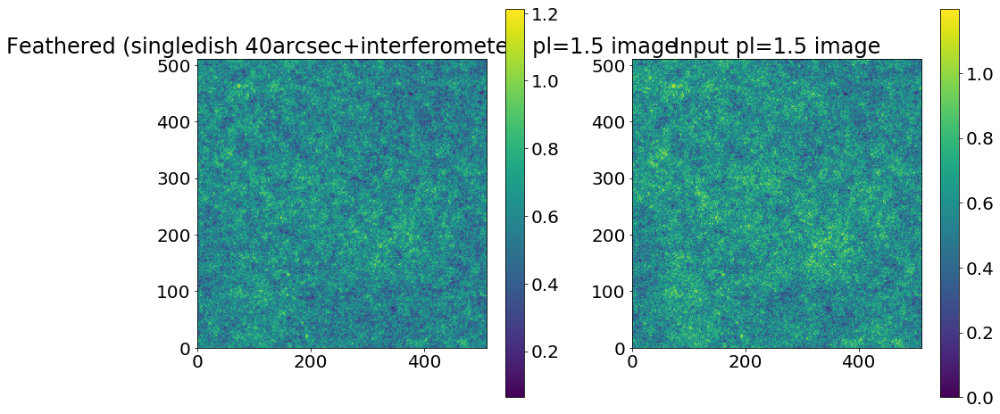

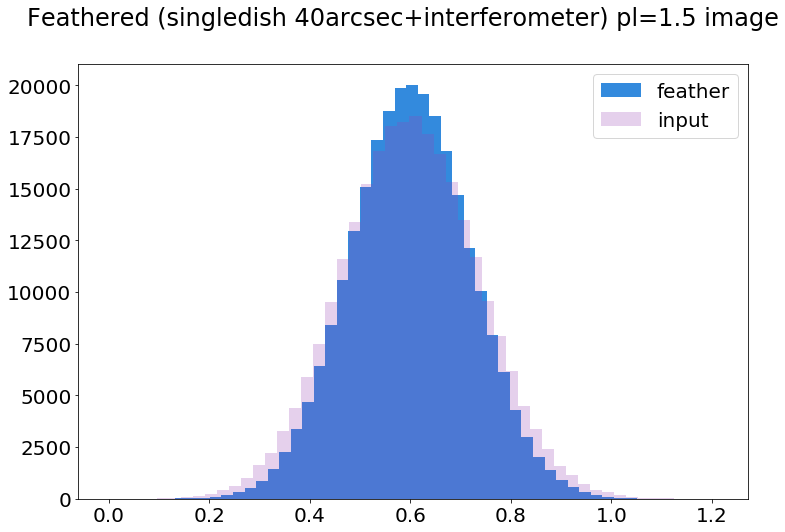

In [46]:
combo_replace_hires_02 = feather_simple(intf_hdu,
                                        sd_hdu,
                                        highresscalefactor=1.0,
                                        lowresscalefactor=1.0,
                                        lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                                        replace_hires=0.2,
                                        match_units=False,
                              )

# Feathered dataset
pl.figure(1, figsize=(16,8)).clf()
pl.subplot(1,2,1)
pl.imshow(combo_replace_hires_02.real, cmap='viridis')
pl.colorbar()
pl.title("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
pl.subplot(1,2,2)
pl.imshow(im, cmap='viridis')
pl.colorbar()
pl.title("Input pl=1.5 image")


# Feathered dataset
pl.figure(2).clf()
pl.suptitle("Feathered (singledish 40arcsec+interferometer) pl=1.5 image")
_ = pl.hist(combo_replace_hires_02.real.ravel(), bins=50, label='feather')
_ = pl.hist(im.ravel(), bins=50, alpha=0.25, label='input')
leg = pl.legend(loc='best')

This approach is fairly suspect.  All it does is take the original single-dish and interferometer images, fourier transform them, then replace the pixels out to a certain radius with the interferometric data.  

The above figures show some case studies.  Can we assess this more quantitatively?

In order to make the test a little more clear, we'll make the interferometer have "perfect" resolution, i.e., no small-angular-scale cutoff.

In [47]:
# See above
largest_scale = 80.*u.arcsec
image_scale = im.shape[0]*pixscale # assume symmetric (default=256)
ring = (rr>=(image_scale/largest_scale))

imfft = np.fft.fft2(im)
imfft_interferometered = imfft * np.fft.fftshift(ring)
im_interferometered = np.fft.ifft2(imfft_interferometered)
intf_hdu = fits.PrimaryHDU(data=im_interferometered.real, header=header)

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


Text(0,0.5,'Squared difference between maps (zero is perfect)')

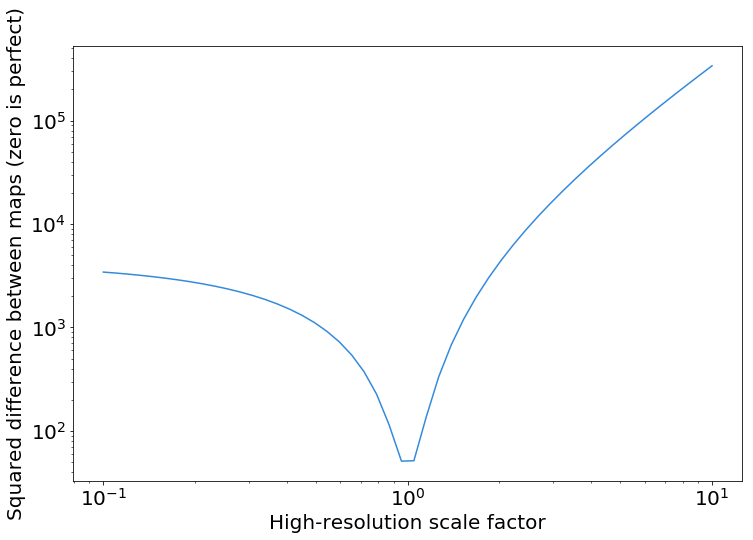

In [48]:
diff_sqs = []
for highresscalefactor in np.logspace(-1,1):
    combo = feather_simple(intf_hdu,
                           sd_hdu,
                           highresscalefactor=highresscalefactor,
                           lowresscalefactor=1.0,
                           lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                           match_units=False,
                                  )                        
    diff_sqs.append(((combo.real-im)**2).sum())

pl.loglog(np.logspace(-1,1), diff_sqs)
pl.xlabel("High-resolution scale factor")
pl.ylabel("Squared difference between maps (zero is perfect)")

Next, let's assess how well feather performs as a function of interferomtric LAS.

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


Text(0,0.5,'Squared difference between maps (zero is perfect)')

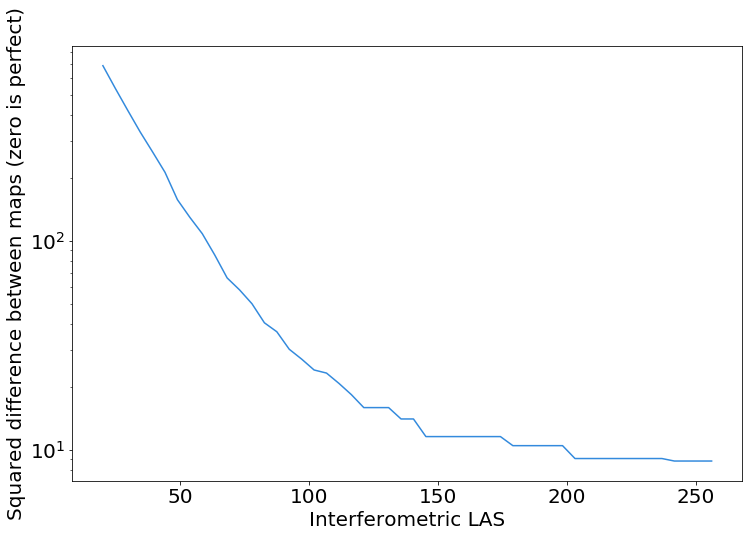

In [49]:
# singledish scale is fixed at 40"
diff_sqs = []

for largest_scale in np.linspace(20,256)*u.arcsec:

    image_scale = im.shape[0]*pixscale # assume symmetric (default=256)
    ring = (rr>=(image_scale/largest_scale))

    imfft = np.fft.fft2(im)
    imfft_interferometered = imfft * np.fft.fftshift(ring)
    im_interferometered = np.fft.ifft2(imfft_interferometered)
    intf_hdu = fits.PrimaryHDU(data=im_interferometered.real, header=header)
    
    combo = feather_simple(intf_hdu,
                           sd_hdu,
                           highresscalefactor=1.0,
                           lowresscalefactor=1.0,
                           lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                           match_units=False,
                          )                        
    diff_sqs.append(((combo.real-im)**2).sum())
    
pl.semilogy(np.linspace(20,256), diff_sqs)
pl.xlabel("Interferometric LAS")
pl.ylabel("Squared difference between maps (zero is perfect)")

Same thing, but with a fixed largest-angular-scale and a changing Single Dish FWHM

/Users/adam/miniconda3/lib/python3.7/site-packages/reproject-0.5-py3.7-macosx-10.7-x86_64.egg/reproject/interpolation/core_celestial.py:26: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(array.dtype, np.float):


Text(0,0.5,'Squared difference between maps (zero is perfect)')

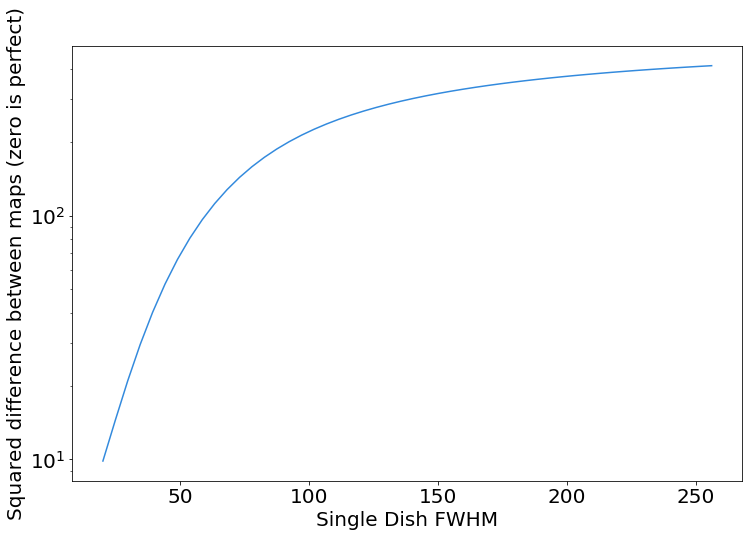

In [50]:
largest_scale = 80*u.arcsec #fixed LAS
image_scale = im.shape[0]*pixscale # assume symmetric (default=256)
ring = (rr>=(image_scale/largest_scale))

imfft = np.fft.fft2(im)
imfft_interferometered = imfft * np.fft.fftshift(ring)
im_interferometered = np.fft.ifft2(imfft_interferometered)
intf_hdu = fits.PrimaryHDU(data=im_interferometered.real, header=header)


diff_sqs = []

for lowresfwhm in np.linspace(20,256):

    singledish_im = convolution.convolve_fft(im,
                                             convolution.Gaussian2DKernel(lowresfwhm/2.35),
                                             boundary='fill', fill_value=im.mean())
    sd_hdu = fits.PrimaryHDU(data=singledish_im, header=header)

    combo = feather_simple(intf_hdu,
                           sd_hdu,
                           highresscalefactor=1.0,
                           lowresscalefactor=1.0,
                           lowresfwhm=u.Quantity(lowresfwhm, u.arcsec),
                           match_units=False,
                          )                        
    diff_sqs.append(((combo.real-im)**2).sum())
    
pl.semilogy(np.linspace(20,256), diff_sqs)
pl.xlabel("Single Dish FWHM")
pl.ylabel("Squared difference between maps (zero is perfect)")

Clearly the single dish FWHM makes a pretty big difference...

# Below here are just experiments #

We used `feather_compare` to directly compare images in fourier space.  What happens if you compare them in image space after filtering?

1. Reset to 120" LAS interferometer and 40" FWHM SD

In [51]:
largest_scale = 120*u.arcsec #fixed LAS
image_scale = im.shape[0]*pixscale # assume symmetric (default=256)
ring = (rr>=(image_scale/largest_scale))

imfft = np.fft.fft2(im)
imfft_interferometered = imfft * np.fft.fftshift(ring)
im_interferometered = np.fft.ifft2(imfft_interferometered)
im_hi = im_interferometered.real

intf_hdu = fits.PrimaryHDU(data=im_hi, header=header)

lowresfwhm = 40.
singledish_im = convolution.convolve_fft(im,
                                         convolution.Gaussian2DKernel(lowresfwhm/2.35),
                                         boundary='fill', fill_value=im.mean())
sd_hdu = fits.PrimaryHDU(data=singledish_im, header=header)

In [52]:
SAS = 40*u.arcsec
LAS = 120*u.arcsec


nax2, nax1 = im.shape
lowresfwhm = u.Quantity(lowresfwhm, u.arcsec)
pixscale = u.Quantity(pixscale, u.arcsec)

kfft, ikfft = feather_kernel(nax2, nax1, lowresfwhm, pixscale)
kfft = np.fft.fftshift(kfft)
ikfft = np.fft.fftshift(ikfft)

yy,xx = np.indices([nax2, nax1])
rr = ((xx-(nax1-1)/2.)**2 + (yy-(nax2-1)/2.)**2)**0.5
angscales = nax1/rr * pixscale*u.deg

fft_hi = np.fft.fftshift(np.fft.fft2(np.nan_to_num(im_hi)))
fft_lo = np.fft.fftshift(np.fft.fft2(np.nan_to_num(im_low)))
fft_lo_deconvolved = fft_lo / kfft

min_beam_fraction = 0.05
plot_min_beam_fraction = 0.05
below_beamscale = kfft < min_beam_fraction
below_beamscale_plotting = kfft < plot_min_beam_fraction

mask = (angscales > SAS) & (angscales < LAS) & (~below_beamscale)
assert mask.sum() > 0

hi_img_ring = (np.fft.ifft2(np.fft.fftshift(fft_hi*mask)))
lo_img_ring = (np.fft.ifft2(np.fft.fftshift(fft_lo*mask)))
lo_img_ring_deconv = (np.fft.ifft2(np.fft.fftshift(np.nan_to_num(fft_lo_deconvolved*mask))))
inp_img_ring = np.fft.ifft2(np.fft.fft2(im)*np.fft.fftshift(mask))


/Users/adam/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in true_divide
/Users/adam/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide


UnitConversionError: Can only apply 'greater' function to quantities with compatible dimensions

In these images, we compare the "intermediate scales" (the scales in the UV overlap regime) between the interferometric and single-dish data.  The interferometric data is from a "perfect interferometer", while the single dish data is from a "realistic" single-dish, i.e., one with a Gaussian beam.  The single-dish "intermediate scales" are too smooth (dominated by large angular scales) prior to deconvolution.

In [ ]:
pl.figure(1, figsize=(16,5)).clf()
pl.subplot(1,3,1)
pl.imshow((hi_img_ring).real, cmap='viridis')
pl.colorbar()
pl.title("Interferometer mid-scales")
pl.subplot(1,3,2)
pl.imshow((lo_img_ring).real, cmap='viridis')
pl.colorbar()
pl.title("SD mid scales")
pl.subplot(1,3,3)
pl.imshow((lo_img_ring_deconv).real, cmap='viridis')
pl.colorbar()
pl.title("SD mid scales (deconv)")

pl.figure()
pl.imshow((inp_img_ring).real, cmap='viridis')
pl.title("Input mid-scales (back of the book)")

The single-dish and interferometer UV-overlap "intermediate scales" are very closely correlated, but that correlation is noisy.

In [ ]:
pl.plot((lo_img_ring_deconv.real).ravel(), (hi_img_ring.real).ravel(), ',', alpha=0.05)
pl.plot([-4,4],[-4,4],'k--')

In [ ]:
_=pl.hist((lo_img_ring_deconv.real).ravel() / (hi_img_ring.real).ravel(), bins=np.linspace(0.5,2), log=True)

In [ ]:
ratio = (lo_img_ring_deconv.real).ravel() / (hi_img_ring.real).ravel()
sd_weighted_mean_ratio = ((lo_img_ring_deconv.real.ravel())**2 * ratio).sum() / ((lo_img_ring_deconv.real.ravel())**2).sum()
sd_weighted_mean_ratio

In [ ]:
ratio = (lo_img_ring_deconv.real).ravel() / (hi_img_ring.real).ravel()
intf_weighted_mean_ratio = ((hi_img_ring.real.ravel())**2 * ratio).sum() / ((hi_img_ring.real.ravel())**2).sum()
intf_weighted_mean_ratio

In [ ]:
# find the scale factor that minimizes the distance between the images
diffsq = [((lo_img_ring_deconv.real - scf*hi_img_ring.real)**2).sum() for scf in np.linspace(0.5,2.0)]
pl.plot(np.linspace(0.5,2.0), diffsq)
np.linspace(0.5,2.0)[np.argmin(diffsq)]

Try Singular Value Decomposition to determine the scale factor.  Doesn't come very close to a useful answer.

In [ ]:
U,S,V = np.linalg.svd(np.array([lo_img_ring_deconv.real.ravel(), hi_img_ring.real.ravel()]).T,
                      full_matrices=False)

In [ ]:
V[0,:]/V[1,:]

In [ ]:
print("largest_Scale: {0} lowresfwhm: {1}".format(largest_scale, lowresfwhm))
stats = feather_compare(intf_hdu,
                        sd_hdu,
                        SAS=u.Quantity(lowresfwhm,u.arcsec),
                        LAS=u.Quantity(largest_scale,u.arcsec),
                        lowresfwhm=u.Quantity(lowresfwhm,u.arcsec),
                        beam_divide_lores=True,
                       )
print("Fourier-based results: ", stats)

The above plot shows three panels:

(top left): The measured amplitude of the FFT of the low-resolution (single-dish) image on the Y-axis vs the measured ampitude of the FFT of the high-resolution (interferometer) image on the X-axis.  Only pixels in the "UV overlap range" defined by the mask `mask = (angscales > SAS) & (angscales < LAS) & (~below_beamscale)` are included.  The 1-1 line, i.e., the perfect match line, is dashed. An approximate best-fit value is shown with the dotted line; this value is reported as `'median_sc'` in the results.

(top right): Histogram of the ratio of the high resolution / low resolution data in the masked region (i.e., ratio of the X-axis to the Y-axis of the top-left plot)

(bottom): The amplitude of the high-resolution interferometric (red) and low-resolution, *deconvolved* single-dish (blue) data versus angular scale.  The black curve shows the single-dish kernel.  The vertical black lines bracket the "UV overlap" space selected by the largest/smallest angular scale parameters.



The overall conclusion of the above scale factor determination attempts: Both approaches are noisy, but get to within about 10% of the true scale factor (1.0) in this idealized case.

In [ ]:
from uvcombine.uvcombine import angular_range_image_comparison

How well does the angular range image comparison perform for different values of the largest/smallest angular scale?

(assuming we always get the FWHM right)

In [ ]:
scalefactors = np.zeros([50,50])
for ii,LAS in enumerate(np.linspace(40,220)*u.arcsec):
    
    for jj,SAS in enumerate(np.linspace(10,100)*u.arcsec):
        try:
            scalefactor = angular_range_image_comparison(intf_hdu,
                                                        sd_hdu,
                                                        SAS=SAS,
                                                        LAS=LAS,
                                                        lowresfwhm=u.Quantity(lowresfwhm,u.arcsec),
                                                        beam_divide_lores=True,
                                                         min_beam_fraction=0.005,
                                                       )
            scalefactors[ii,jj] = scalefactor
        except Exception as ex:
            continue


In [ ]:
pl.imshow(scalefactors, extent=[10,100,40,220], aspect=1./2); pl.colorbar()
pl.plot([lowresfwhm.value,lowresfwhm.value],[40,220],'k-')
pl.plot([10,100],[largest_scale,largest_scale],'k-')
pl.xlabel("Smallest Angular Scale")
pl.ylabel("Largest Angular Scale")

In this figure, the correct answer is 1.00, i.e., the images were input on identical "flux scales" and need no additional scaling.  The vertical and horizontal lines show the "true" LAS and SAS, where SAS = the low resolution FWHM (i.e., it is approximate because it's just a scaling parameter of a Gaussian) while the LAS represents the sharp cutoff of the simulated interferometer. 

This is a useful summary figure.  As long as you get the largest angular scale approximately correct, to within ~20-30%, you won't miss by more than ~20-30%, but it gets quite bad from there.  It is best to guess too low for the LAS, thereby including "too much" flux below the single-dish beam scale; this makes sense since the FWHM is not a strict cutoff.

You're best guessing too high for the smallest angular scale.  Something like 25-50% larger than the FWHM is much better than using the exact FWHM.

Narrow ranges are noisy, but they appear to do the best in terms of getting the right answer.

In [ ]:
from uvcombine.uvcombine import scale_comparison

### Compare the images to the correct answer as a function of scale ###

On its own, this scale comparison doesn't say much, except that the original and 'feathered' images get pretty close but never converge.  This might be useful for comparing a few different methods and seeing how well they each converge.

In [ ]:
scales = np.arange(1,64)
chi2s_of_scale = scale_comparison(im, combo.real, scales)

In [ ]:
pl.plot(scales, chi2s_of_scale)

In [ ]:
scales_bigsteps = np.arange(32,256,32)
chi2s_of_scale_bigsteps = scale_comparison(im, combo.real, scales_bigsteps)
pl.plot(scales_bigsteps, chi2s_of_scale_bigsteps)

So what happens to convergence as you mess up the parameters (i.e., try to reproduce some immerge behavior, and/or reproduce calibration errors)?

In [ ]:
pl.figure(figsize=(12,8))
bad_combos = {}
# correct lowresfwhm is 40
for highresscalefactor, lowresscalefactor, lowresfwhm in (
    (1,1,40),
    (1,1.1,40),
    (1,0.9,40),
    (0.9,1.0,40),
    (1.1,1.0,40),
    (1.0,1.0,60),
    (1.0,1.0,30),
):
        combo_ = feather_simple(intf_hdu,
                                sd_hdu,
                                highresscalefactor=highresscalefactor,
                                lowresscalefactor=highresscalefactor,
                                lowresfwhm=lowresfwhm*u.arcsec,
                                match_units=False,
                               )
        scales_bigsteps = np.arange(32,256,32)
        chi2s_of_scale_bigsteps = scale_comparison(im, combo_.real, scales_bigsteps)
        label = (highresscalefactor,lowresscalefactor,lowresfwhm)
        bad_combos[label] = chi2s_of_scale_bigsteps
        pl.plot(scales_bigsteps, chi2s_of_scale_bigsteps, label="HRSF={0} LRSF={1} LRFWHM={2}".format(*label))
        
pl.legend(loc='best')

Conclusion: difference-squared is not a very useful metric to assess image quality.  The power-spectrum-based comparisons are better.

## Another test: How much noise is added to the image when you miss intermediate scales?

This is set up with a somewhat plausible setup for ALMA:

 * 40" largest-angular scale (e.g., ~7m)
 * 33" single-dish FWHM (Bolocam @ CSO @ 1.1mm)
 * 2" interferometer FWHM (config 1-ish)

In [ ]:
# LAS for 7m separation
(1.13*1.3*u.mm/(7*u.m)).to(u.arcsec, u.dimensionless_angles())

In [ ]:
from uvcombine.tests import utils
from uvcombine import feather_simple
from astropy import units as u
from astropy.io import fits
from astropy import log

In [ ]:
pixel_scale = 1*u.arcsec
log.info("Generate input image")
input_hdu = utils.generate_test_fits(imsize=512, powerlaw=1.5, beamfwhm=2*u.arcsec, pixel_scale=pixel_scale)
log.info("make Interferometric image")
intf_hdu = fits.PrimaryHDU(data=
        utils.interferometrically_observe_image(image=input_hdu.data,
                                                pixel_scale=pixel_scale,
                                                largest_angular_scale=40*u.arcsec,
                                                smallest_angular_scale=2*u.arcsec)[0].real,
                           header=input_hdu.header
                          )
log.info("make SD image")
sd_header = input_hdu.header.copy()
sd_header['BMAJ'] = sd_header['BMIN'] = (33*u.arcsec).to(u.deg).value
sd_hdu = fits.PrimaryHDU(data=utils.singledish_observe_image(image=input_hdu.data,
                                                             pixel_scale=pixel_scale,
                                                             smallest_angular_scale=33*u.arcsec),
                           header=sd_header
                          )
log.info("Feather data")
feathered_hdu = feather_simple(hires=intf_hdu, lores=sd_hdu, return_hdu=True)

Look at the raw results.  The problems are pretty obvious.

In [ ]:
pl.figure(figsize=(16,3))
pl.subplot(1,4,1)
pl.imshow(input_hdu.data); pl.colorbar()
pl.subplot(1,4,2)
pl.imshow(intf_hdu.data); pl.colorbar()
pl.subplot(1,4,3)
pl.imshow(sd_hdu.data); pl.colorbar()
pl.subplot(1,4,4)
pl.imshow(feathered_hdu.data); pl.colorbar()

Compare the input to output on a linear scale

In [ ]:
pl.plot(input_hdu.data.ravel(), feathered_hdu.data.ravel(), ',', alpha=0.25)
pl.plot([0,10],[0,10])

How much noise have we added to the image?  Something like 10% of the peak amplitude... not great.

In [ ]:
print("Noise added that is not observational but is intrinsic: {0}".format((input_hdu.data-feathered_hdu.data).std()))